<h3>This notebook contains code to subset gene expression and ATAC gene score AnnData objects, retaining only cells with matching cell IDs.

In [3]:
# Imports
import scdrs
import scanpy as sc
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import re

In [4]:
data_dir = Path("../Data") 
atac_file = data_dir / "ATAC" / "combined_gene_scores.h5ad"
expr_file = data_dir / "SCDRS" / "multiome"/ "UT+24hCA_6ct_UT_nohvg.h5ad"

In [ ]:
# Read files
atac_adata = sc.read_h5ad(atac_file, backed="r")

In [3]:
expr_adata = sc.read_h5ad(expr_file)
expr_adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 130728 × 25048
    obs: 'cell_id', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'barcode', 'barcode_1', 'barcode_lane', 'lane', 'batch', 'percent.mt', 'nCount_RNA_mad', 'nFeature_RNA_mad', 'confined_best_match_sample', 'confined_second_match_sample', 'confined_best_match_correlation', 'confined_second_match_correlation', 'confined_condition', 'unconfined_best_match_sample', 'unconfined_second_match_sample', 'unconfined_best_match_correlation', 'unconfined_second_match_correlation', 'unconfined_condition', 'soup_cluster', 'soup_status', 'soup_singlet_posterior', 'soup_doublet_posterior', 'soup_log_prob_singleton', 'soup_log_prob_doublet', 'soup_cluster0', 'soup_cluster1', 'soup_cluster2', 'soup_cluster3', 'soup_cluster4', 'soup_cluster5', 'soup_cluster6', 'soup_cluster7', 'sample_final', 'final_condition', 'predicted.mo_10x_cell_type', 'predicted.mo_10x_cell_type.score', 'predicted.mo_10x_cell_type.lowerres', 'nCount_

In [32]:
expr_adata.obs_names

Index(['AAGCAAGTCCTTGCAC_230105_lane1', 'CTAAGTCAGGGTGAAC_230105_lane1',
       'CATTGTGCACCAGGTT_230105_lane1', 'CTGTTGGAGTGACCTG_230105_lane1',
       'TAATGCATCTCACATT_230105_lane1', 'CGGTGAGAGCTTTGTT_230105_lane1',
       'GCCTAATAGGAACACA_230105_lane1', 'GCAAGTCGTGTTAGCA_230105_lane1',
       'CGGAGCAAGTCATCCC_230105_lane1', 'TAACCGGTCGCAGGCT_230105_lane1',
       ...
       'GCATCCTTCAAGACTC_230316_lane6', 'CGCAAATTCTGTAATG_230316_lane6',
       'GGACATAAGTCACCTC_230316_lane6', 'TAGCTAGGTAATCACG_230316_lane6',
       'CTTTCTTGTCCTGATT_230316_lane6', 'ATACCGGTCGGCTAGC_230316_lane6',
       'GGTTATGGTAATCACG_230316_lane6', 'GGCCAGTTCATTAGTG_230316_lane6',
       'CATCCTTCAGGTTTGC_230316_lane6', 'CGAATCTAGTGGACAA_230316_lane6'],
      dtype='object', name='cell_id', length=130728)

In [ ]:
expr_cells = list(expr_adata.obs_names)
expr_cells

In [ ]:
atac_cells = list(atac_adata.obs_names)
atac_cells

In [54]:
matched_ids_old = []
matched_ids_new = []

# Reformat cell ids to match expression adata object ID's
for cell_id in atac_cells:
    match = re.match(r"^(.*)#([ACGT]+)-1$", cell_id)
    if match:
        lane = match.group(1)
        barcode = match.group(2)
        matched_id = f"{barcode}_{lane}"
        if matched_id in expr_cells:
            matched_ids_old.append(cell_id)
            matched_ids_new.append(matched_id)
            
print(f"Found {len(matched_ids_old)}/{len(expr_cells)} id's")
    

Found 103539/130728 id's


In [ ]:
unmatched_ids = list(set(expr_cells) - set(matched_ids_new))
print(unmatched_ids)

In [ ]:
# Ensure unmatched_ids is a set for faster lookup
unmatched_ids_set = set(unmatched_ids)

# Subset the obs DataFrame to those IDs and extract the sample_id column
unmatched_sample_ids = expr_adata.obs.loc[expr_adata.obs_names.isin(unmatched_ids_set), "sample_final"]
unmatched_celltypes_ids = expr_adata.obs.loc[expr_adata.obs_names.isin(unmatched_ids_set), "celltype_imputed_lowerres"]

print(unmatched_sample_ids.unique())
print(unmatched_celltypes_ids.unique())

In [63]:
with open("unmatched_cell_ids.txt", "w") as f:
    for item in unmatched_ids:
        f.write(f"{item}\n")


# Subset

In [28]:
atac_file = data_dir / "ATAC" / "atac_gene_scores" / "subsetted_gene_scores.h5ad"
atac_adata = sc.read_h5ad(atac_file)

In [ ]:
id_file = data_dir / "ATAC" / "atac_gene_scores" / "matched_cell_ids.txt"
with open(id_file) as f:
    ids = [line.strip() for line in f]



In [14]:
atac_adata.obs_names[0:5]

Index(['230316_lane6#CCTCAAACATCTAGCA-1', '230316_lane6#GTGCTTACAGGCTTCG-1',
       '230316_lane6#AATCTTGAGTTATCCT-1', '230316_lane6#TATAGCCAGTAACGAG-1',
       '230316_lane6#GTGCCTTTCGCAATCG-1'],
      dtype='object')

In [15]:
ids[0:5]

['CCTCAAACATCTAGCA_230316_lane6',
 'GTGCTTACAGGCTTCG_230316_lane6',
 'AATCTTGAGTTATCCT_230316_lane6',
 'TATAGCCAGTAACGAG_230316_lane6',
 'GTGCCTTTCGCAATCG_230316_lane6']

In [29]:
# Change to 
atac_adata.obs_names = ids
atac_adata.obs_names

Index(['CCTCAAACATCTAGCA_230316_lane6', 'GTGCTTACAGGCTTCG_230316_lane6',
       'AATCTTGAGTTATCCT_230316_lane6', 'TATAGCCAGTAACGAG_230316_lane6',
       'GTGCCTTTCGCAATCG_230316_lane6', 'CATTATCTCCCTCGCA_230316_lane6',
       'GAAACCCGTCAGGCAT_230316_lane6', 'GCTAAGTTCACTAAGC_230316_lane6',
       'TCCTAGTGTCATTGAG_230316_lane6', 'AGTGAACCATGCATAT_230316_lane6',
       ...
       'CAGCATTAGGGATGCG_230202_lane3', 'AAGCCTGTCGCAACAT_230202_lane3',
       'CTAGTAGGTTACAACG_230202_lane3', 'GATTATGTCCATAATG_230202_lane3',
       'AAGCGCTGTAATTAGC_230202_lane3', 'CCTAAGCCATAGCGGA_230202_lane3',
       'TAATGGTGTGCTTACT_230202_lane3', 'AATAGAGGTTCATCTA_230202_lane3',
       'TCGGTAAGTTAACGAT_230202_lane3', 'CGGTTCCGTGGAAGGC_230202_lane3'],
      dtype='object', length=103539)

In [30]:
# Add metadata
atac_adata.obs = expr_adata.obs.loc[ids].copy()
atac_adata

AnnData object with n_obs × n_vars = 103539 × 23963
    obs: 'cell_id', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'barcode', 'barcode_1', 'barcode_lane', 'lane', 'batch', 'percent.mt', 'nCount_RNA_mad', 'nFeature_RNA_mad', 'confined_best_match_sample', 'confined_second_match_sample', 'confined_best_match_correlation', 'confined_second_match_correlation', 'confined_condition', 'unconfined_best_match_sample', 'unconfined_second_match_sample', 'unconfined_best_match_correlation', 'unconfined_second_match_correlation', 'unconfined_condition', 'soup_cluster', 'soup_status', 'soup_singlet_posterior', 'soup_doublet_posterior', 'soup_log_prob_singleton', 'soup_log_prob_doublet', 'soup_cluster0', 'soup_cluster1', 'soup_cluster2', 'soup_cluster3', 'soup_cluster4', 'soup_cluster5', 'soup_cluster6', 'soup_cluster7', 'sample_final', 'final_condition', 'predicted.mo_10x_cell_type', 'predicted.mo_10x_cell_type.score', 'predicted.mo_10x_cell_type.lowerres', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res

In [31]:
# Log transform gene scores
sc.pp.log1p(atac_adata)

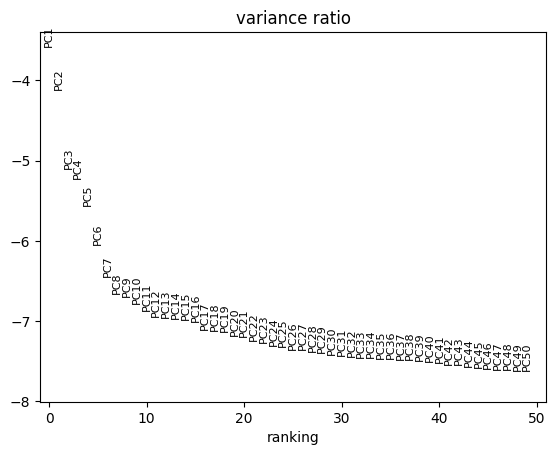

In [34]:
sc.pl.pca_variance_ratio(atac_adata, n_pcs=50, log=True)

In [ ]:
# Preform clustering
sc.tl.pca(atac_adata)
sc.pp.neighbors(atac_adata)
sc.tl.umap(atac_adata)

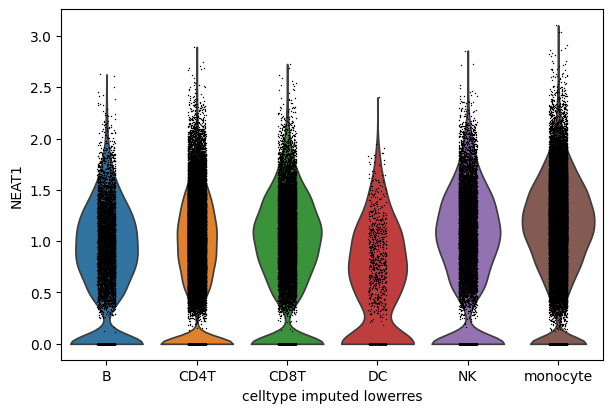

In [32]:
sc.pl.violin(atac_adata, keys="NEAT1", groupby="celltype_imputed_lowerres")

In [22]:
# Corresponding gene expression subset
expr_adata_subset = expr_adata[ids].copy()
expr_adata_subset

AnnData object with n_obs × n_vars = 103539 × 25048
    obs: 'cell_id', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'barcode', 'barcode_1', 'barcode_lane', 'lane', 'batch', 'percent.mt', 'nCount_RNA_mad', 'nFeature_RNA_mad', 'confined_best_match_sample', 'confined_second_match_sample', 'confined_best_match_correlation', 'confined_second_match_correlation', 'confined_condition', 'unconfined_best_match_sample', 'unconfined_second_match_sample', 'unconfined_best_match_correlation', 'unconfined_second_match_correlation', 'unconfined_condition', 'soup_cluster', 'soup_status', 'soup_singlet_posterior', 'soup_doublet_posterior', 'soup_log_prob_singleton', 'soup_log_prob_doublet', 'soup_cluster0', 'soup_cluster1', 'soup_cluster2', 'soup_cluster3', 'soup_cluster4', 'soup_cluster5', 'soup_cluster6', 'soup_cluster7', 'sample_final', 'final_condition', 'predicted.mo_10x_cell_type', 'predicted.mo_10x_cell_type.score', 'predicted.mo_10x_cell_type.lowerres', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res

In [23]:
# Re-cluster expression data
sc.tl.pca(expr_adata_subset)
sc.pp.neighbors(expr_adata_subset)
sc.tl.umap(expr_adata_subset)

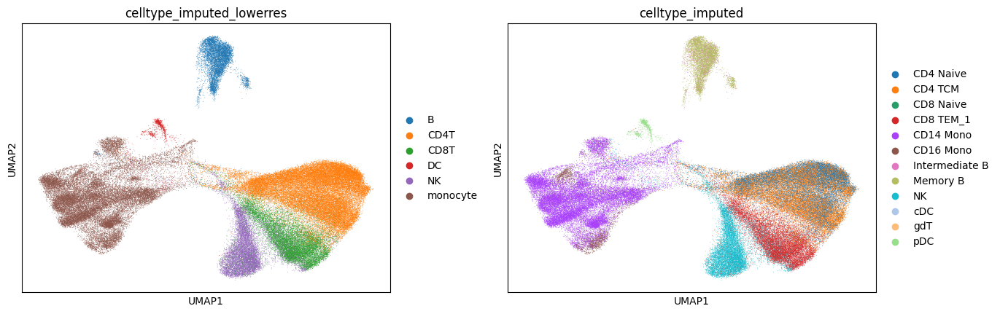

In [46]:
sc.pl.umap(atac_adata, color=["celltype_imputed_lowerres", "celltype_imputed"], wspace=0.2, )

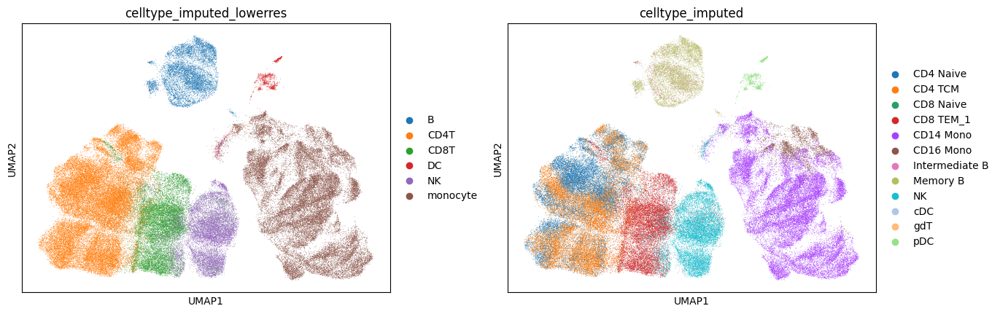

In [41]:
sc.pl.umap(expr_adata_subset, color=["celltype_imputed_lowerres", "celltype_imputed"], wspace=0.2)

In [48]:
def save_general_umap_plots(
    adata,
    figdir,
    colors=["celltype_imputed_lowerres", "celltype_imputed", "batch", "sample_final"],
    color_map="RdBu_r",
    vmin=-5,
    vmax=5,
    wspace=0.7,
    titles = ["Cell Type", "Cell Type", "Batch", "Samples"]
):
    figdir.mkdir(parents=True, exist_ok=True)
    sc.settings.figdir = figdir
    
    for idx, color in enumerate(colors):
        sc.pl.umap(
            adata,
            color=[color],
            ncols=1,
            color_map=color_map,
            vmin=vmin,
            vmax=vmax,
            wspace=wspace,
            show=False,
            save=f"_{color}.png",
            title=titles[idx]  
        )
    print(f"UMAPs saved to {figdir}")


# Set current directory and figure DPI
figdir = Path(".")
sc.settings.set_figure_params(dpi=300)


for adata in [expr_adata_subset, atac_adata]:
    save_general_umap_plots(adata, figdir)



UMAPs saved to .


In [ ]:
atac_adata.obs["sample_final"].unique()

In [3]:
atc = "../Data/SCDRS/multiome/ATAC_gene_scores_pp.h5ad"
atac_adata = sc.read_h5ad(atc)

In [5]:
expr_adata_file = "../Data/SCDRS/multiome/ATAC_gene_expression_pp.h5ad"
expr_adata_subset = sc.read_h5ad(expr_adata_file)

In [9]:
# Add categorical covariates
atac_adata.obs["sex_code"] = atac_adata.obs["sex"].astype("category").cat.codes
atac_adata.obs["batch_code"] = atac_adata.obs["batch"].astype("category").cat.codes
atac_adata.obs["age"] = atac_adata.obs["age"].astype(int)

expr_adata_subset.obs["sex_code"] = expr_adata_subset.obs["sex"].astype("category").cat.codes
expr_adata_subset.obs["batch_code"] = expr_adata_subset.obs["batch"].astype("category").cat.codes
expr_adata_subset.obs["age"] = expr_adata_subset.obs["age"].astype(int)

In [10]:
# Save subsets
out_dir = data_dir / "SCDRS"/ "multiome"
atac_adata.write_h5ad(out_dir / "ATAC_gene_scores_pp.h5ad")
expr_adata_subset.write_h5ad(out_dir / "ATAC_gene_expression_pp.h5ad")

In [10]:
celltype_map = {
    "CD4T": "CD4⁺ T",
    "CD8T": "CD8⁺ T",
    "B": "B",
    "NK": "NK",
    "monocyte": "Monocyte",
    "DC": "Dendritic"
}
# Apply mapping
expr_adata_subset.obs["celltype_pretty"] = expr_adata_subset.obs["celltype_imputed_lowerres"].map(celltype_map)

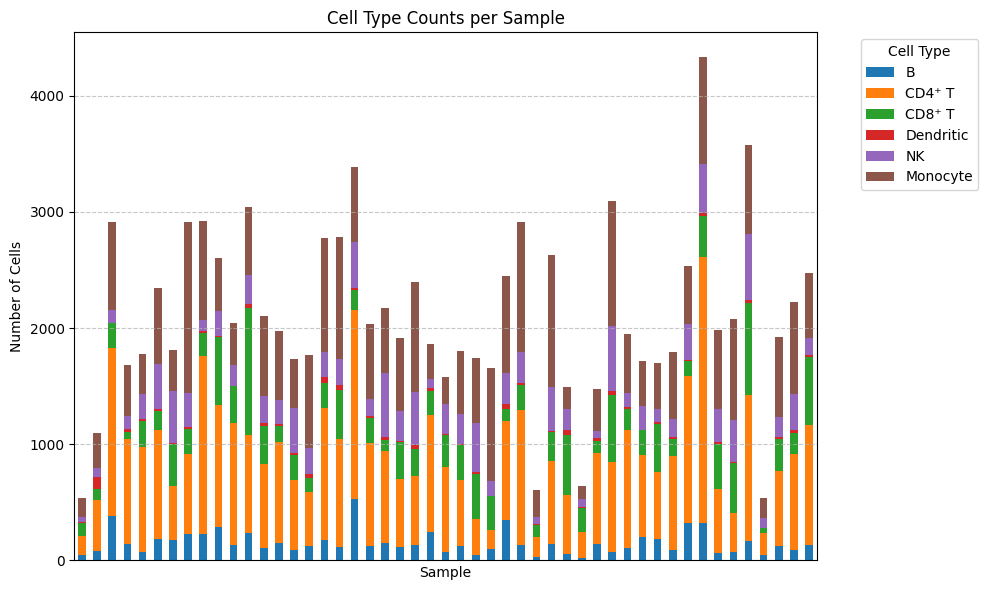

In [11]:
# Plot as stacked bar
ct_counts = pd.crosstab(expr_adata_subset.obs["sample_final"], expr_adata_subset.obs["celltype_pretty"])

ct_counts.plot(kind="bar", stacked=True, figsize=(10, 6))
plt.xlabel("Sample")
plt.ylabel("Number of Cells")
plt.title("Cell Type Counts per Sample")
plt.legend(title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Hide x-axis tick labels
plt.xticks([], [])  # Remove labels and ticks
plt.tight_layout()
plt.show()


# ATAC + RNA combined UMAPs

In [3]:
concat_adata_file = "../Data/SCDRS/multiome/atac_rna_concat.h5ad"

In [4]:
adata = sc.read_h5ad(concat_adata_file)

/groups/umcg-franke-scrna/tmp04/users/umcg-hdijkstra/scscore/lib64/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [5]:
fig_dir = "../Results/multiomics/general_umaps"
sc.settings.figdir = fig_dir


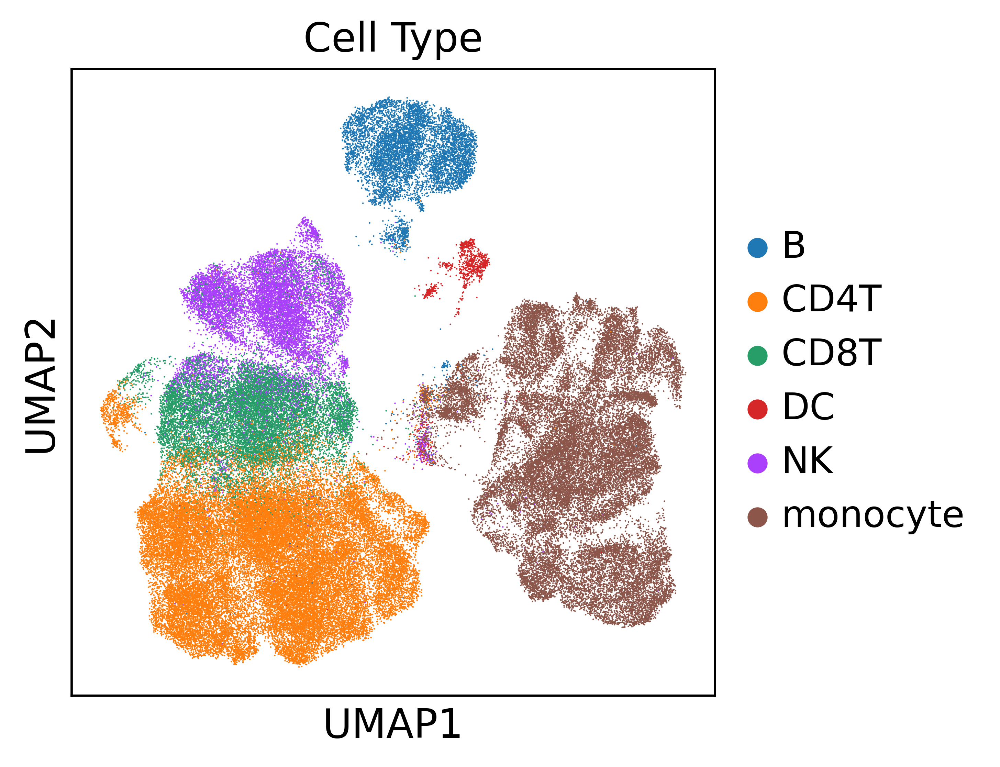

In [9]:

sc.settings.set_figure_params(dpi=300)
sc.pl.umap(adata, color=["celltype_imputed_lowerres"], title="Cell Type", save="_ATAC+RNA_lowerres.png")

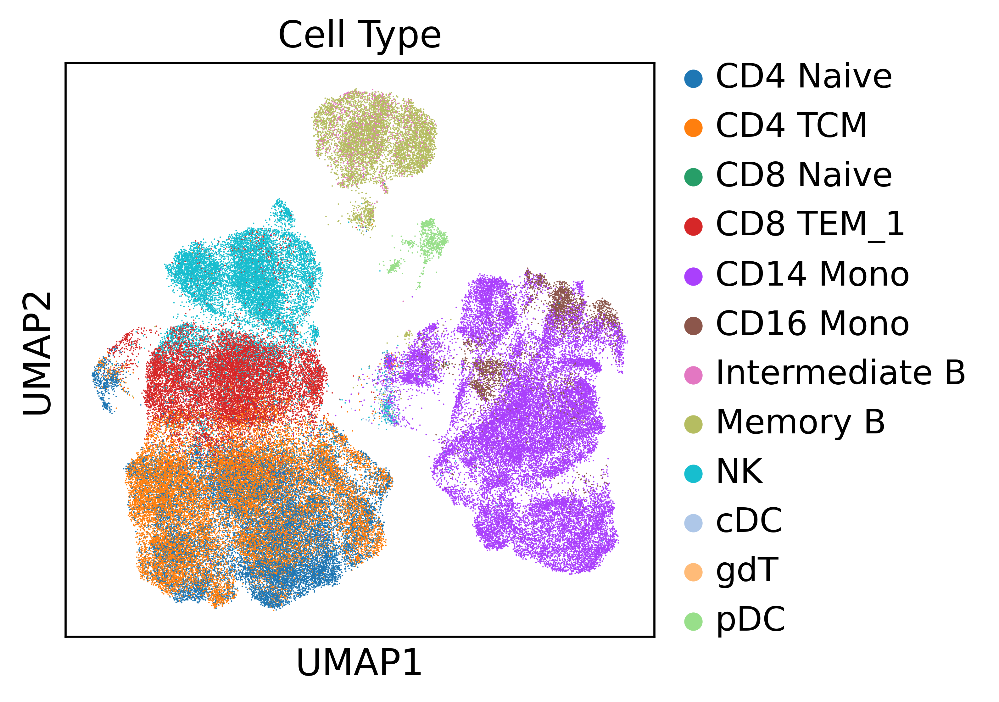

In [10]:
sc.pl.umap(adata, color=["celltype_imputed"], title="Cell Type", save="_ATAC+RNA.png")


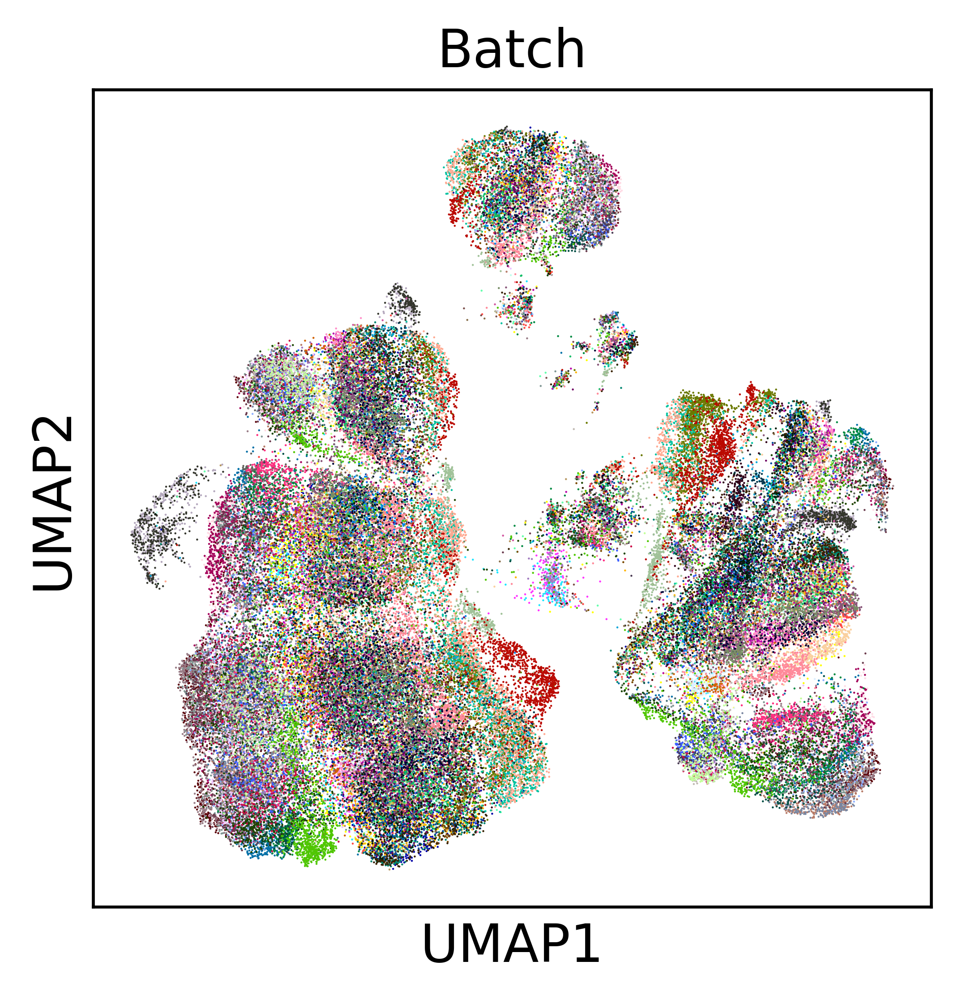

In [13]:
sc.pl.umap(adata, color=["batch"], title="Batch", save="_ATAC+RNA_Batch.png", legend_loc=None)

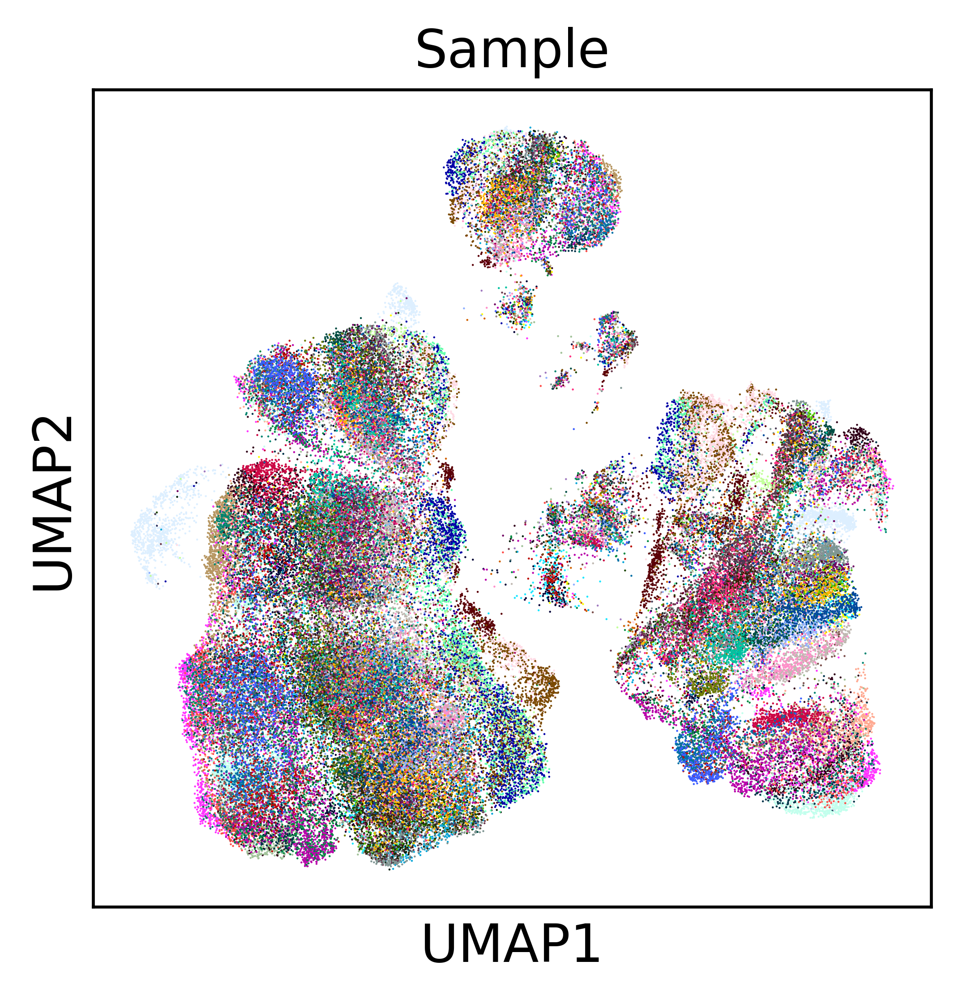

In [14]:
sc.pl.umap(adata, color=["sample_final"], title="Sample", save="_ATAC+RNA_Sample.png", legend_loc=None)